# Research Question
For our project, we will be researching crime data in Los Angeles and how that data is affected by various variables such as COVID-19, educational attainment, and household income. Due to the global pandemic, crime rates have fluctuated substantially due to the lockdown and the reopening of the county.

# Data Sources
- Crime Data from 2020 to present, https://data.lacity.org/A-Safe-City/Crime-Data-from-2020-to-Present/2nrs-mtv8
- COVID-19 Data from 2020 to present, https://github.com/datadesk/california-coronavirus-data/blob/master/latimes-place-totals.csv
- Household Income for LA County (2018), Social Explorer
- White vs. Non-White Homeowners (2018), Social Explorer
- Mapping Inequality/ Home Owners Loan Corporation (HOLC) LA Redlining Map (1939), clsl.richmond.edu 
- LA Times - Neighborhoods, http://boundaries.latimes.com/sets/

*Note: We removed the Education Attainment dataset from Social Explorer because we decided that we have too many variables to compare.


# Data Exploration and Analysis

Now we want to explore our data sources and provide an analysis of our datasets.

## COVID-19 Rates in California
We will begin our data exploration by importing the current COVID-19 data from the LA times.

In [1]:
import plotly.express as px
import pandas as pd

In [2]:
latimes = pd.read_csv(
    "https://raw.githubusercontent.com/datadesk/california-coronavirus-data/master/latimes-place-totals.csv")

In [3]:
# Now we want to get some basic statistics from the dataset. How many rows and columns?
latimes.shape

(227064, 9)

In [4]:
#What are the first 5 rows?
latimes.head()

,date,county,fips,place,confirmed_cases,note,x,y,population
0,2020-11-22,Alameda,1.0,94501: Alameda,509,NaN,-122.274583,37.774606,62826.0
1,2020-11-22,Alameda,1.0,94502: Alameda,76,NaN,-122.241149,37.736988,14117.0
2,2020-11-22,Alameda,1.0,94536: Fremont,758,NaN,-121.987951,37.570977,72976.0
3,2020-11-22,Alameda,1.0,94538: Fremont,769,NaN,-121.977924,37.499148,63911.0
4,2020-11-22,Alameda,1.0,94539: Fremont,247,NaN,-121.912764,37.526588,52960.0


In [5]:
# dataframe info?
latimes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227064 entries, 0 to 227063
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   date             227064 non-null  object 
 1   county           227064 non-null  object 
 2   fips             225231 non-null  float64
 3   place            227064 non-null  object 
 4   confirmed_cases  227064 non-null  int64  
 5   note             9045 non-null    object 
 6   x                224763 non-null  float64
 7   y                224763 non-null  float64
 8   population       215195 non-null  float64
dtypes: float64(4), int64(1), object(4)
memory usage: 15.6+ MB


In [6]:
# Next, we want to clean up the data. This includes empty coordinates, empty confirmed cases, and incorrect coordinates (Note: positive longitudes do not exist in California)
# We do this by using the .query() method that allows us to query and filter the dataset using SQL syntax.
latimes.query("confirmed_cases == 'NaN'")

,date,county,fips,place,confirmed_cases,note,x,y,population


In [7]:
# NaN values for 'x'?
latimes.query("x == 'NaN'")

,date,county,fips,place,confirmed_cases,note,x,y,population
330,2020-11-21,Contra Costa,13.0,Other,212,NaN,NaN,NaN,NaN
362,2020-11-21,Kings,31.0,Other,78,NaN,NaN,NaN,NaN
363,2020-11-21,Kings,31.0,Prisons,4719,NaN,NaN,NaN,NaN
1067,2020-11-21,Yolo,113.0,Other,497,NaN,NaN,NaN,NaN
1131,2020-11-20,Butte,7.0,Other,40,NaN,NaN,NaN,33084.0
...,...,...,...,...,...,...,...,...,...
224666,2020-03-28,Orange,59.0,Other,39,NaN,NaN,NaN,NaN
225030,2020-03-27,Orange,59.0,Other,27,NaN,NaN,NaN,NaN
226687,2020-03-18,Los Angeles,37.0,Other,62,NaN,NaN,NaN,NaN
226779,2020-03-17,Los Angeles,37.0,Other,27,NaN,NaN,NaN,NaN


In [8]:
#NaN values for 'y'?
latimes.query("y == 'NaN'")

,date,county,fips,place,confirmed_cases,note,x,y,population
330,2020-11-21,Contra Costa,13.0,Other,212,NaN,NaN,NaN,NaN
362,2020-11-21,Kings,31.0,Other,78,NaN,NaN,NaN,NaN
363,2020-11-21,Kings,31.0,Prisons,4719,NaN,NaN,NaN,NaN
1067,2020-11-21,Yolo,113.0,Other,497,NaN,NaN,NaN,NaN
1131,2020-11-20,Butte,7.0,Other,40,NaN,NaN,NaN,33084.0
...,...,...,...,...,...,...,...,...,...
224666,2020-03-28,Orange,59.0,Other,39,NaN,NaN,NaN,NaN
225030,2020-03-27,Orange,59.0,Other,27,NaN,NaN,NaN,NaN
226687,2020-03-18,Los Angeles,37.0,Other,62,NaN,NaN,NaN,NaN
226779,2020-03-17,Los Angeles,37.0,Other,27,NaN,NaN,NaN,NaN


In [9]:
# Positive longitude coordinates?
latimes.query("x > 0")

,date,county,fips,place,confirmed_cases,note,x,y,population
2153,2020-11-20,San Mateo,81.0,Pacifica,281,NaN,122.480689,37.610177,39065.0
9452,2020-11-13,San Mateo,81.0,Pacifica,262,NaN,122.480689,37.610177,39065.0
16659,2020-11-06,San Mateo,81.0,Pacifica,245,NaN,122.480689,37.610177,39065.0
25199,2020-10-29,San Mateo,81.0,Pacifica,237,NaN,122.480689,37.610177,39065.0
31366,2020-10-23,San Mateo,81.0,Pacifica,228,NaN,122.480689,37.610177,39065.0
38764,2020-10-16,San Mateo,81.0,Pacifica,223,NaN,122.480689,37.610177,39065.0
45978,2020-10-09,San Mateo,81.0,Pacifica,219,NaN,122.480689,37.610177,39065.0
53245,2020-10-02,San Mateo,81.0,Pacifica,215,NaN,122.480689,37.610177,39065.0
60529,2020-09-25,San Mateo,81.0,Pacifica,212,NaN,122.480689,37.610177,39065.0
67703,2020-09-18,San Mateo,81.0,Pacifica,206,NaN,122.480689,37.610177,39065.0


In [10]:
# Do we have any null dates?
latimes.query("date.isnull()", engine='python')

,date,county,fips,place,confirmed_cases,note,x,y,population


In [11]:
# Now we will combine our arguments and clean the data:
latimes = latimes.query("confirmed_cases != 'NaN' & x < 0 & x != 'NaN' & date.notnull()", engine='python')
latimes.head()

,date,county,fips,place,confirmed_cases,note,x,y,population
0,2020-11-22,Alameda,1.0,94501: Alameda,509,NaN,-122.274583,37.774606,62826.0
1,2020-11-22,Alameda,1.0,94502: Alameda,76,NaN,-122.241149,37.736988,14117.0
2,2020-11-22,Alameda,1.0,94536: Fremont,758,NaN,-121.987951,37.570977,72976.0
3,2020-11-22,Alameda,1.0,94538: Fremont,769,NaN,-121.977924,37.499148,63911.0
4,2020-11-22,Alameda,1.0,94539: Fremont,247,NaN,-121.912764,37.526588,52960.0


In [12]:
# How many records do we have now?
latimes.shape
# Less columns than before

(224728, 9)

In [13]:
# Now we want to look at more statistics in our dataset. Let's look at confirmed cases.
latimes.confirmed_cases.describe()

count    224728.000000
mean        418.377034
std         969.099114
min           1.000000
25%          18.000000
50%          90.000000
75%         392.000000
max       20083.000000
Name: confirmed_cases, dtype: float64

In [14]:
# Let's see which counties in California have the most confirmed cases.
latimes.groupby("county").confirmed_cases.describe().sort_values(by=["max"], ascending=False)

,count,mean,std,min,25%,50%,75%,max
county,,,,,,,,
Fresno,2533.0,454.334781,1821.336262,1.0,18.0,58.0,264.00,20083.0
Santa Clara,3126.0,778.948496,2528.021345,1.0,37.0,122.0,455.75,19863.0
Sacramento,1364.0,1257.722141,3054.187502,1.0,49.0,263.5,797.25,18711.0
Los Angeles,76275.0,493.499967,961.006536,1.0,23.0,116.0,521.00,15124.0
Orange,9453.0,704.431186,1590.967830,1.0,46.0,181.0,646.00,13267.0
San Bernardino,11441.0,591.304169,1419.637960,1.0,7.0,40.0,350.00,12798.0
Riverside,10977.0,461.820625,1063.574846,1.0,22.0,97.0,362.00,11596.0
Stanislaus,1511.0,573.205824,1216.700944,1.0,17.0,131.0,403.00,7372.0
Monterey,812.0,1450.076355,1762.009576,8.0,196.5,778.5,2000.00,6970.0


In [15]:
# Since our research question is focused on Los Angeles County, let's look at which cities in LA County have the highest confirmed cases. 
latimes_LA = latimes.query("county=='Los Angeles'")

In [16]:
latimes_LA.groupby("place").confirmed_cases.describe().sort_values(by=["max"], ascending=False).head(50)

,count,mean,std,min,25%,50%,75%,max
place,,,,,,,,
Long Beach,247.0,6559.433198,5113.905728,5.0,1284.50,6522.0,11503.00,15124.0
East Los Angeles,245.0,3632.624490,2747.558231,1.0,598.00,3943.0,6161.00,8170.0
Pomona,239.0,3069.079498,2498.991292,1.0,356.00,3085.0,5383.00,7546.0
Palmdale,241.0,2446.273859,1929.572226,1.0,606.00,2151.0,4024.00,6794.0
North Hollywood,247.0,2198.809717,1742.083021,1.0,562.00,1935.0,3751.50,5776.0
South Gate,242.0,2590.421488,1937.477201,1.0,426.50,2945.0,4364.25,5768.0
El Monte,234.0,2580.794872,1915.542476,1.0,471.75,2883.5,4299.50,5681.0
Lancaster,245.0,1992.489796,1610.914056,1.0,489.00,1775.0,3277.00,5623.0
Glendale,248.0,2212.463710,1612.042682,2.0,847.25,1991.5,3551.25,5611.0


In [50]:
# Let's create a bar chart representing the confirmed cases in LA County overtime.
LACounty = latimes.query("county == ['Los Angeles']")
px.bar(LACounty,
      x='date',
      y='confirmed_cases')

In [51]:
# Let's be more specific. Let's create a bar chart of the top three cities in LA County with the highest confirmed cases: Long Beach, East Los Angeles, and Pomona.
TopLA = latimes.query("place == ['Long Beach','East Los Angeles','Pomona']")
px.bar(TopLA,
      x='date',
      y='confirmed_cases',
      color = 'place')

Now that we've looked at the top three cities with the highest confirmed COVID-19 cases, let's represent our dataset in a different visualization format. 
Let's create an animated scatter plot to represent the change overtime of confirmed cases in cities across LA County.

In [52]:
# What is the mean of  confirmed cases in LA County?
latimes_LA_mean = latimes_LA.confirmed_cases.mean()
latimes_LA_mean

493.499967223861

In [ ]:
# Now, let's put this information on a map.
fig = px.scatter_geo(latimes_LA,
           lon='x',
           lat='y',
           color='confirmed_cases', 
           size='confirmed_cases',
           size_max=40, 
           hover_name='place',
           scope='usa',                     
           animation_frame='date',
           color_continuous_scale = 'RdYlGn_r',
           range_color = (0,latimes_LA_mean*2))

fig.update_geos(fitbounds="locations") 

An issue we had with this animated scatterplot was that the animation began from the present to March, instead of vice versa. This is something we will have to address before our final.

## Crime Rates in the City of Los Angeles
Let's look at crime rates in LA County from 2020 to present. We will begin by importing the data.

In [17]:
import pandas as pd
import plotly.express as px
from sodapy import Socrata

### Creating a Socrata Client
Next, we acquire the data using the socrata API. 
- https://dev.socrata.com/foundry/data.lacity.org/2nrs-mtv8

In [18]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("2nrs-mtv8", limit=2000)

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
df.sample(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,weapon_used_cd,weapon_desc,status,status_desc,crm_cd_1,location,lat,lon,crm_cd_2,cross_street
1401,200907126,2020-03-09T00:00:00.000,2020-03-08T00:00:00.000,1500,09,Van Nuys,0966,2,662,"BUNCO, GRAND THEFT",...,NaN,NaN,IC,Invest Cont,662,4700 WOODMAN AV,34.156,-118.4312,998,NaN
73,200104058,2020-01-02T00:00:00.000,2020-01-01T00:00:00.000,1940,01,Central,0135,2,624,BATTERY - SIMPLE ASSAULT,...,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,624,LOS ANGELES ST,34.0485,-118.2447,NaN,2ND ST


In [19]:
# Now, we want to add a "where" statement to look at the data from March 1, 2020 to April 30, 2020, limited to 30,000.
results = client.get("2nrs-mtv8", 
                     limit = 30000, 
                     where = "date_rptd between '2020-03-01T00:00:00' and '2020-04-30T00:00:00'"
                    )

In [20]:
# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

### Data Exploration and Analysis of Crime Data

In [21]:
# how many rows and columns?
df.shape

(30000, 28)

In [22]:
# what fields and datatypes?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   dr_no           30000 non-null  object
 1   date_rptd       30000 non-null  object
 2   date_occ        30000 non-null  object
 3   time_occ        30000 non-null  object
 4   area            30000 non-null  object
 5   area_name       30000 non-null  object
 6   rpt_dist_no     30000 non-null  object
 7   part_1_2        30000 non-null  object
 8   crm_cd          30000 non-null  object
 9   crm_cd_desc     30000 non-null  object
 10  mocodes         26003 non-null  object
 11  vict_age        30000 non-null  object
 12  vict_sex        26198 non-null  object
 13  vict_descent    26198 non-null  object
 14  premis_cd       29999 non-null  object
 15  premis_desc     29987 non-null  object
 16  weapon_used_cd  10832 non-null  object
 17  weapon_desc     10832 non-null  object
 18  status

In [23]:
# First 5 rows?
df.head()

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,status,status_desc,crm_cd_1,location,cross_street,lat,lon,crm_cd_2,crm_cd_3,crm_cd_4
0,200607206,2020-03-01T00:00:00.000,2020-02-29T00:00:00.000,1900,06,Hollywood,0645,1,815,SEXUAL PENETRATION W/FOREIGN OBJECT,...,IC,Invest Cont,815,HOLLYWOOD,HIGHLAND,34.1016,-118.3387,NaN,NaN,NaN
1,201407485,2020-03-01T00:00:00.000,2020-03-01T00:00:00.000,1350,14,Pacific,1406,1,761,BRANDISH WEAPON,...,AO,Adult Other,624,3800 KEYSTONE AV,NaN,34.0189,-118.4056,761,998,NaN
2,202006971,2020-03-01T00:00:00.000,2020-02-02T00:00:00.000,1000,20,Olympic,2062,2,860,BATTERY WITH SEXUAL CONTACT,...,AO,Adult Other,860,3200 W PICO BL,NaN,34.0506,-118.3127,NaN,NaN,NaN
3,200307647,2020-03-01T00:00:00.000,2020-03-01T00:00:00.000,0935,03,Southwest,0317,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,AO,Adult Other,740,2400 S CATALINA ST,NaN,34.0337,-118.2942,NaN,NaN,NaN
4,201807506,2020-03-01T00:00:00.000,2020-03-01T00:00:00.000,1450,18,Southeast,1846,2,626,INTIMATE PARTNER - SIMPLE ASSAULT,...,AA,Adult Arrest,626,ZAMORA,114TH,33.931,-118.2511,NaN,NaN,NaN


In [ ]:
# Let's make a bar graph with labels.
px.bar(df,
       x='date_rptd',
       title='Crime Rates in Los Angeles, March to April 2020',
       labels={'date_rptd':'Date of Crimes','count':'Number of Crimes'}
      )

For the final, we will look into using matplotlib instead of plotly.

In [24]:
# first convert the date field to a datetime type
df['date_rptd'] = pd.to_datetime(df['date_rptd'])

In [25]:
# Grouping by month and day
df_date = df.groupby([df["date_rptd"].dt.month.rename('month'),df["date_rptd"].dt.day.rename('day')],as_index=False).size().reset_index(name='count')

In [26]:
# Let's look at the distinct value of charges
df.crm_cd_desc.unique()

array(['SEXUAL PENETRATION W/FOREIGN OBJECT', 'BRANDISH WEAPON',
       'BATTERY WITH SEXUAL CONTACT',
       'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
       'INTIMATE PARTNER - SIMPLE ASSAULT', 'VEHICLE - STOLEN',
       'INTIMATE PARTNER - AGGRAVATED ASSAULT', 'CRIMINAL HOMICIDE',
       'THEFT PLAIN - PETTY ($950 & UNDER)', 'VIOLATION OF COURT ORDER',
       'BURGLARY FROM VEHICLE',
       'VIOLATION OF TEMPORARY RESTRAINING ORDER',
       'VIOLATION OF RESTRAINING ORDER',
       'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
       'ATTEMPTED ROBBERY', 'BATTERY - SIMPLE ASSAULT',
       'CRIMINAL THREATS - NO WEAPON DISPLAYED', 'ROBBERY',
       'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
       'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)',
       'CHILD NEGLECT (SEE 300 W.I.C.)',
       'SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
       'OTHER MISCELLANEOUS CRIME',
       'VANDALISM - MISDEAMEANOR ($399 OR UNDER)', 'RESISTING ARREST',
       'RAPE, FORCIBLE', 'CH

In [27]:
df_date.head()

,month,day,count
0,3,1,491
1,3,2,674
2,3,3,589
3,3,4,578
4,3,5,583


In [28]:
# create a label field
df_date['label'] = df_date.month.astype('str')+'-'+df_date.day.astype('str')

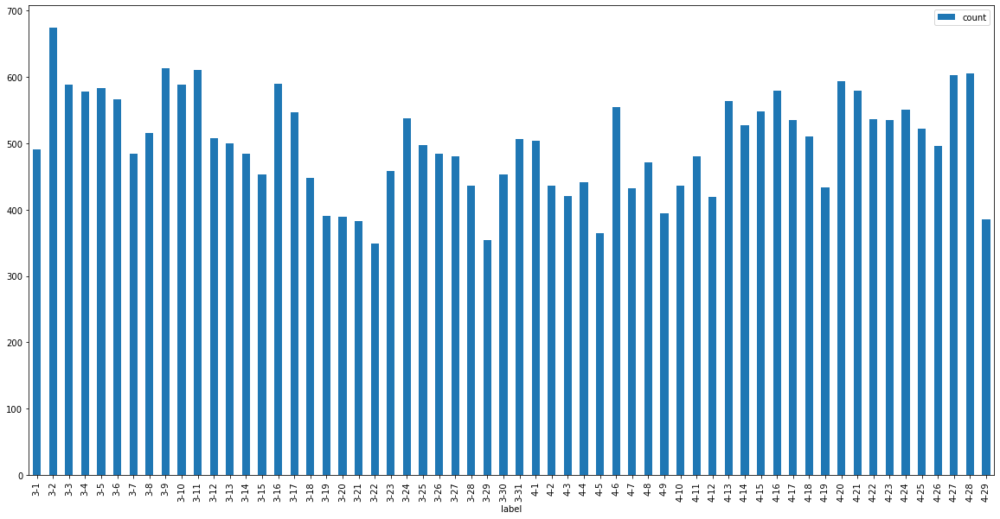

In [29]:
df_date.plot(figsize=(20,10),kind="bar",x='label',y='count')

In [53]:
# Let's clean up the labels.
px.bar(df,
       x='date_rptd',
       title='Crime Rates in Los Angeles, March to April 2020',
       labels={'date_rptd':'Date of Crimes','count':'Number of Crimes'}
      )

In [30]:
# Let's look at  the top 25 distinct value of charges
crime_by_type = df.crm_cd_desc.value_counts().reset_index()
crime_by_type.head(25)

,index,crm_cd_desc
0,VEHICLE - STOLEN,3139
1,BATTERY - SIMPLE ASSAULT,2487
2,BURGLARY FROM VEHICLE,2151
3,BURGLARY,2001
4,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",1949
5,INTIMATE PARTNER - SIMPLE ASSAULT,1733
6,THEFT PLAIN - PETTY ($950 & UNDER),1675
7,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),1627
8,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1605
9,VANDALISM - MISDEAMEANOR ($399 OR UNDER),1090


In [31]:
# Rename our columns
crime_by_type.columns=['crime','count']
crime_by_type.head(25)

,crime,count
0,VEHICLE - STOLEN,3139
1,BATTERY - SIMPLE ASSAULT,2487
2,BURGLARY FROM VEHICLE,2151
3,BURGLARY,2001
4,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",1949
5,INTIMATE PARTNER - SIMPLE ASSAULT,1733
6,THEFT PLAIN - PETTY ($950 & UNDER),1675
7,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),1627
8,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1605
9,VANDALISM - MISDEAMEANOR ($399 OR UNDER),1090


In [32]:
# Let's create a horizontal bar chart.
px.bar(crime_by_type.head(25).sort_values(by='count',ascending=True),
       y='crime',
       x='count',
       orientation= 'h',
       height=800,
       width=900,
       title='Crime Rates in Los Angeles, March to April 2020')

In Yoh's comments for our midterm, Yoh was able to fix the overlapping text issue by adding 'height=800', however on my end, they were still overlapping, so I also added 'width=900'.

In [33]:
# Now, let's subset our data and begin mapping the dataset.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   dr_no           30000 non-null  object        
 1   date_rptd       30000 non-null  datetime64[ns]
 2   date_occ        30000 non-null  object        
 3   time_occ        30000 non-null  object        
 4   area            30000 non-null  object        
 5   area_name       30000 non-null  object        
 6   rpt_dist_no     30000 non-null  object        
 7   part_1_2        30000 non-null  object        
 8   crm_cd          30000 non-null  object        
 9   crm_cd_desc     30000 non-null  object        
 10  mocodes         26003 non-null  object        
 11  vict_age        30000 non-null  object        
 12  vict_sex        26198 non-null  object        
 13  vict_descent    26198 non-null  object        
 14  premis_cd       29999 non-null  object        
 15  pr

Let's eliminate the unnecessary fields and create a subset of the data with just the following fields:

- `date_rptd`
- `crm_cd`
- `crm_cd_desc`
- `lat`
- `lon`

In [34]:
# subset the data
df_mini = df[['date_rptd','crm_cd','crm_cd_desc','lat','lon']].copy()
df_mini.head()

,date_rptd,crm_cd,crm_cd_desc,lat,lon
0,2020-03-01,815,SEXUAL PENETRATION W/FOREIGN OBJECT,34.1016,-118.3387
1,2020-03-01,761,BRANDISH WEAPON,34.0189,-118.4056
2,2020-03-01,860,BATTERY WITH SEXUAL CONTACT,34.0506,-118.3127
3,2020-03-01,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",34.0337,-118.2942
4,2020-03-01,626,INTIMATE PARTNER - SIMPLE ASSAULT,33.931,-118.2511


In [35]:
# Check the info for our subset data
df_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date_rptd    30000 non-null  datetime64[ns]
 1   crm_cd       30000 non-null  object        
 2   crm_cd_desc  30000 non-null  object        
 3   lat          30000 non-null  object        
 4   lon          30000 non-null  object        
dtypes: datetime64[ns](1), object(4)
memory usage: 1.1+ MB


In [54]:
# Now we want to convert latitude and longitude to floats
df_mini['lat'] = df_mini['lat'].astype(float)
df_mini['lon'] = df_mini['lon'].astype(float)
df_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date_rptd    30000 non-null  datetime64[ns]
 1   crm_cd       30000 non-null  object        
 2   crm_cd_desc  30000 non-null  object        
 3   lat          30000 non-null  float64       
 4   lon          30000 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 1.1+ MB


In [58]:
fig = px.scatter_mapbox(df_mini,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-terrain")
fig.show()

In [59]:
# Let's try color-coding the crimes and creating an animation.
fig = px.scatter_mapbox(df_mini,
                        lat='lat',
                        lon='lon',
                        color='crm_cd',
                        animation_frame = 'date_rptd',)

fig.update_layout(mapbox_style="carto-darkmatter")
fig.show()

ValueError: 
    Invalid value of type 'pandas._libs.tslibs.timestamps.Timestamp' received for the 'name' property of frame
        Received value: Timestamp('2020-03-01 00:00:00')

    The 'name' property is a string and must be specified as:
      - A string
      - A number that will be converted to a string

I'm not sure why this code isn't working anymore. It worked for our midterm notebook, however. We may not include this though in our final project since we already have a COVID animation.

### Creating a Function
Now, we want to create a function and create multi-layered maps.

In [36]:
import geopandas as gpd
# for basemaps
import contextily as ctx

In [37]:
# get neighborhood boundaries from the LA Times
neighborhoods = gpd.read_file('http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/la-county-neighborhoods-v5.geojson')

In [38]:
# trim the data to the bare minimum columns
neighborhoods = neighborhoods[['name','geometry']]
neighborhoods.head()

,name,geometry
0,Acton,"MULTIPOLYGON (((-118.20262 34.53899, -118.1894..."
1,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004..."
2,Agoura Hills,"MULTIPOLYGON (((-118.76193 34.16820, -118.7263..."
3,Agua Dulce,"MULTIPOLYGON (((-118.25468 34.55830, -118.2555..."
4,Alhambra,"MULTIPOLYGON (((-118.12175 34.10504, -118.1168..."


In [39]:
# get the layers into a web mercator projection
# reproject to web mercator
neighborhoods = neighborhoods.to_crs(epsg=3857)

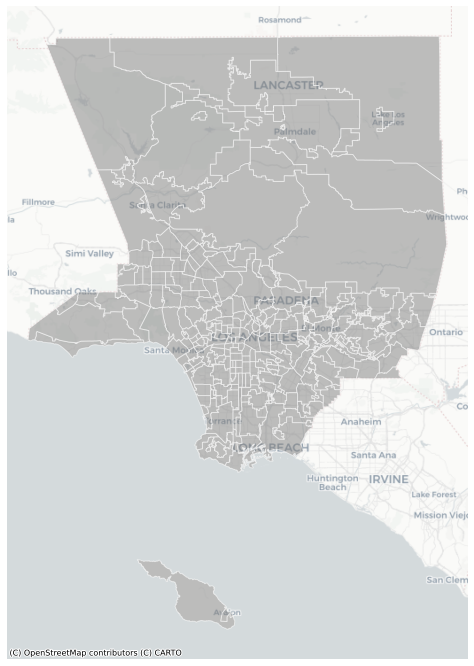

In [40]:
# plot it!
ax=neighborhoods.plot(figsize=(12,12),
                      color='gray', 
                      edgecolor='white',
                      alpha=0.5)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [41]:
# columns
list(df)

['dr_no',
 'date_rptd',
 'date_occ',
 'time_occ',
 'area',
 'area_name',
 'rpt_dist_no',
 'part_1_2',
 'crm_cd',
 'crm_cd_desc',
 'mocodes',
 'vict_age',
 'vict_sex',
 'vict_descent',
 'premis_cd',
 'premis_desc',
 'weapon_used_cd',
 'weapon_desc',
 'status',
 'status_desc',
 'crm_cd_1',
 'location',
 'cross_street',
 'lat',
 'lon',
 'crm_cd_2',
 'crm_cd_3',
 'crm_cd_4']

In [42]:
# convert pandas dataframe to geodataframe
crimes = gpd.GeoDataFrame(df, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df.lon, df.lat))

In [43]:
# get the layers into a web mercator projection
# reproject to web mercator
crimes = crimes.to_crs(epsg=3857)

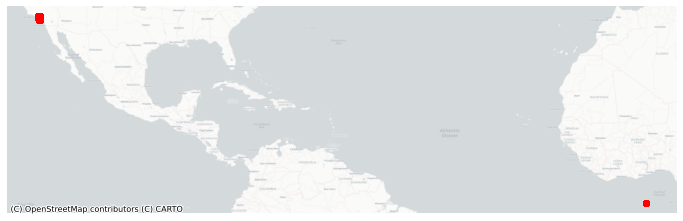

In [61]:
# Now let's map it.
ax = crimes.plot(figsize=(12,12),color='red')
crimes.drop(crimes[crimes.lon==0].index,inplace=True)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

I added the code 'crimes.drop(crimes[crimes.lon==0].index,inplace=True)' that Yoh sugested in order to drop (0,0) coordinates, however I'm still unsuccessful.

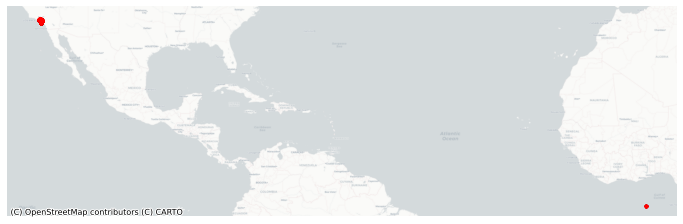

In [62]:
# Now we want to create a two-layered map.
# first, we define which layers will be our "base"
base = neighborhoods.plot(figsize=(12,10),
                      color='gray', 
                      edgecolor='white',
                      alpha=0.5)

# define the layer that will go on top, and add the base layer to the `ax` argument
ax = crimes.plot(ax=base, color='red', markersize=5)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [67]:
# get the bounding box coordinates for the crime data
crimes.geometry.total_bounds

array([-13209293.22896971,         0.        ,         0.        ,
         4073024.2642503 ])

In [68]:
# shortcut to put them into their own variables
minx, miny, maxx, maxy = crimes.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209293.228969714
0.0
0.0
4073024.2642503045


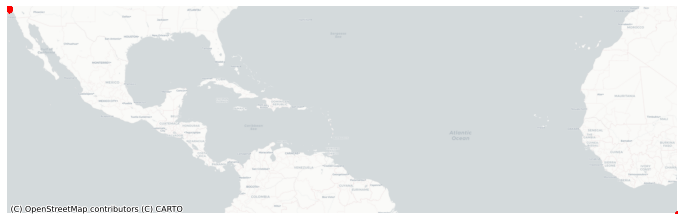

In [69]:
# use the bounding box coordinates to set the x and y limits
base = neighborhoods.plot(figsize=(12,12),
                          color='gray', 
                          edgecolor='white',
                          alpha=0.5)

ax = crimes.plot(ax=base, 
                color='red', 
                markersize=5
               )

ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

ax

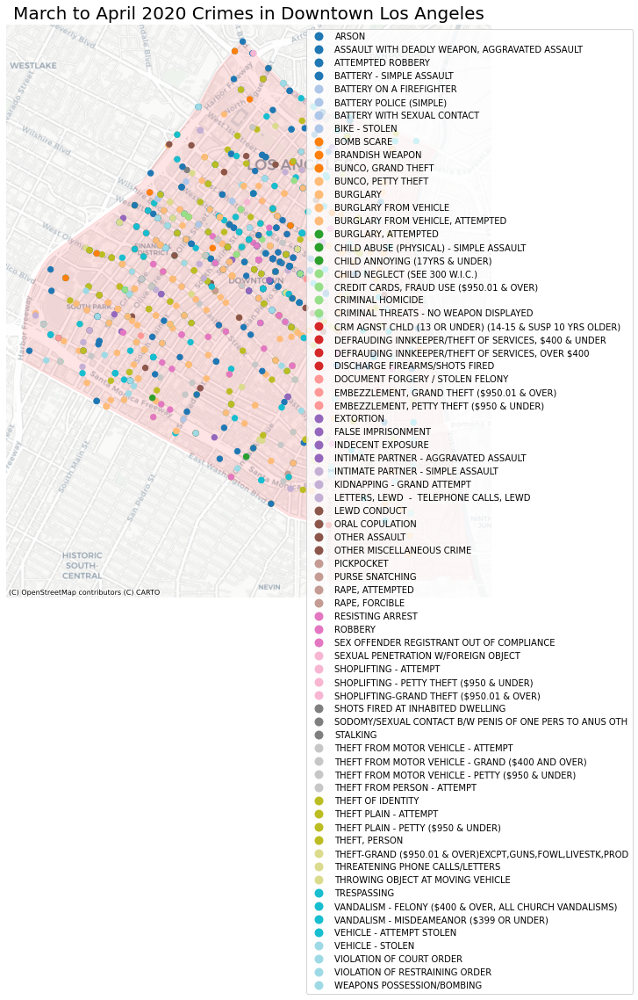

In [71]:
# subset the neighborhoods geodataframe for a single neighborhood
neighborhood = neighborhoods[neighborhoods.name=='Downtown']

# use the bounding box coordinates to set the x and y limits
minx, miny, maxx, maxy = neighborhood.geometry.total_bounds

# do a spatial join to get crime in neighborhood
crimes_in_neighborhood = gpd.sjoin(crimes,neighborhood,how='inner')

# define the base layer to be the neighborhood polygon
base = neighborhood.plot(figsize=(12,12),
                         color='red', 
                         edgecolor='red',
                         alpha=0.1)

# add the crime data, making sure to add the neighborhood polygon
ax = crimes_in_neighborhood.plot(ax=base, 
                                column='crm_cd_desc', 
                                markersize=40, 
                                legend=True,
                                cmap='tab20',
                                legend_kwds={
                                   'loc': 'upper right',
                                   'bbox_to_anchor':(1.3,1)
                                }                  # this puts the legend to the side
                            )

# set the map extent to the extent of the neighborhood bounds
ax.set_xlim(minx - 200, maxx + 200) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 200, maxy + 200)

# turn off the axis
ax.axis('off')

# add a title
ax.set_title('March to April 2020 Crimes in '+neighborhood.name.values[0]+' Los Angeles',fontsize=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax

An issue that we have been having is solving the (0,0) coordinates that distort the maps/plots. This will have to be addressed before our final submission. Additionally, for our final, we'd like to deduce this crime map to reflect the top 25 crimes, as there are too many crimes to aesthetically plot.

# Group Contributions
1. Donna Heydar (Donna contributed to breaking down the educational attainment data in Los Angeles County. Both members discussed which datasets to use and discussed similarities between the two after breaking them down. Donna also contributed to the data exploration and analysis of Crime data in LA as well as COVID-19 data.) 
2. Daniel Ruiz (Daniel contributed to breaking down the household income data in Los Angeles County. Both members discussed which datasets to use and discussed similarities between the two after breaking them down. Daniel also contributed to the data exploration and analysis of HOLC Redlining. He also contributed to the comparison between education  income, and homeownership in Los Angeles.) 

*UPDATE FOR GROUP ASSN #3: Donna cleaned up her notebook and added a function to refelct a map for crime in Downtown, LA. Daniel also cleaned up his notebook and added a function for the redlining map. 